## Texas Salary Prediction

## Business Case -

To create a predictive model which will help the Texas state government team to know the payroll information of employees of the state of Texas.  

#### Load Data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df1 = pd.read_csv('salary1.csv')
df2 = pd.read_csv('salary2.csv')
df = pd.concat([df1,df2],axis=0, ignore_index= True)

C:\Users\samee\AppData\Local\Temp\ipykernel_10468\336918175.py:1: DtypeWarning: Columns (17,19,21) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv('salary1.csv')


In [3]:
pd.set_option('display.max_column',None)

In [4]:
df.head(2)

,Unnamed: 0,AGENCY,AGENCY NAME,LAST NAME,FIRST NAME,MI,CLASS CODE,CLASS TITLE,ETHNICITY,GENDER,STATUS,EMPLOY DATE,HRLY RATE,HRS PER WK,MONTHLY,ANNUAL,STATE NUMBER,duplicated,multiple_full_time_jobs,combined_multiple_jobs,summed_annual_salary,hide_from_search
0,0,241,"COMPTROLLER OF PUBLIC ACCOUNTS, JUDICIARY SECT...",RUCKER,MORTON,V,JD25,"JUDGE, RETIRED ...",WHITE,MALE,URP - UNCLASSIFIED REGULAR PART-TIME,02/18/88,75.96150,29.0,9545.82,114549.84,127717,True,NaN,NaN,131407.08,NaN
1,1,212,OFFICE OF COURT ADMINISTRATION ...,RUCKER,MORTON,V,3524,GENERAL COUNSEL IV ...,WHITE,MALE,CTP - CLASSIFIED TEMPORARY PART-TIME,02-01-2015,81.04454,4.0,1404.77,16857.24,127717,True,NaN,NaN,NaN,True


In [5]:
df.tail(2)

,Unnamed: 0,AGENCY,AGENCY NAME,LAST NAME,FIRST NAME,MI,CLASS CODE,CLASS TITLE,ETHNICITY,GENDER,STATUS,EMPLOY DATE,HRLY RATE,HRS PER WK,MONTHLY,ANNUAL,STATE NUMBER,duplicated,multiple_full_time_jobs,combined_multiple_jobs,summed_annual_salary,hide_from_search
149479,149479,809,STATE PRESERVATION BOARD,YOUNG,DOUGLAS,R,1572,PROGRAM SPECIALIST III ...,WHITE,MALE,CRF - CLASSIFIED REGULAR FULL-TIME,09/22/89,0.00,40.0,5744.16,68929.92,123490,NaN,NaN,NaN,NaN,NaN
149480,149480,809,STATE PRESERVATION BOARD,ZUNKER,GEORGIA,P,130,CUSTOMER SERVICE REP I ...,WHITE,FEMALE,CRP - CLASSIFIED REGULAR PART-TIME,02/16/12,11.74,20.0,1017.46,12209.52,103583,NaN,NaN,NaN,NaN,NaN


### Basic checks

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149481 entries, 0 to 149480
Data columns (total 21 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   AGENCY                   149481 non-null  int64  
 1   AGENCY NAME              149481 non-null  object 
 2   LAST NAME                149481 non-null  object 
 3   FIRST NAME               149481 non-null  object 
 4   MI                       149481 non-null  object 
 5   CLASS CODE               149481 non-null  object 
 6   CLASS TITLE              149481 non-null  object 
 7   ETHNICITY                149481 non-null  object 
 8   GENDER                   149481 non-null  object 
 9   STATUS                   149481 non-null  object 
 10  EMPLOY DATE              149481 non-null  object 
 11  HRLY RATE                149481 non-null  float64
 12  HRS PER WK               149481 non-null  float64
 13  MONTHLY                  149481 non-null  float64
 14  ANNU

In [7]:
df.describe()

,AGENCY,HRLY RATE,HRS PER WK,MONTHLY,ANNUAL,STATE NUMBER,multiple_full_time_jobs,summed_annual_salary
count,149481.000000,149481.000000,149481.000000,149481.000000,149481.000000,1.494810e+05,14.0,16.000000
mean,545.736288,0.346488,39.714918,4226.184248,50714.210973,5.651930e+05,1.0,74303.955000
std,139.057691,4.211485,2.323855,2093.111691,25117.340292,4.786212e+05,0.0,51925.944282
min,101.000000,0.000000,1.000000,50.000000,600.000000,1.000000e+00,1.0,18000.000000
25%,529.000000,0.000000,40.000000,3019.840000,36238.080000,1.133340e+05,1.0,32962.500000
50%,530.000000,0.000000,40.000000,3720.170000,44642.040000,3.463730e+05,1.0,48063.300000
75%,696.000000,0.000000,40.000000,4865.810000,58389.720000,1.100500e+06,1.0,123751.770000
max,930.000000,117.788480,70.000000,46125.000000,553500.000000,1.271604e+06,1.0,171383.400000


In [8]:
df.describe(include ='O')

,AGENCY NAME,LAST NAME,FIRST NAME,MI,CLASS CODE,CLASS TITLE,ETHNICITY,GENDER,STATUS,EMPLOY DATE,duplicated,combined_multiple_jobs,hide_from_search
count,149481,149481,149481,149481,149481,149481,149481,149481,149481,149481,143,97,16
unique,114,38675,23559,27,1481,1422,6,2,11,6295,1,1,1
top,HEALTH AND HUMAN SERVICES COMMISSION ...,SMITH,MICHAEL,,4504,CORREC OFFICER IV ...,WHITE,FEMALE,CRF - CLASSIFIED REGULAR FULL-TIME,09-01-2017,True,True,True
freq,36667,1243,1843,38408,9267,9267,67142,85328,142502,12359,143,97,16


In [9]:
df.shape

(149481, 21)

In [10]:
df.isnull().sum()

AGENCY                          0
AGENCY NAME                     0
LAST NAME                       0
FIRST NAME                      0
MI                              0
CLASS CODE                      0
CLASS TITLE                     0
ETHNICITY                       0
GENDER                          0
STATUS                          0
EMPLOY DATE                     0
HRLY RATE                       0
HRS PER WK                      0
MONTHLY                         0
ANNUAL                          0
STATE NUMBER                    0
duplicated                 149338
multiple_full_time_jobs    149467
combined_multiple_jobs     149384
summed_annual_salary       149465
hide_from_search           149465
dtype: int64

## Data preprocessing

In [11]:
df2 = df.copy()

In [12]:
df2.head(2)

,AGENCY,AGENCY NAME,LAST NAME,FIRST NAME,MI,CLASS CODE,CLASS TITLE,ETHNICITY,GENDER,STATUS,EMPLOY DATE,HRLY RATE,HRS PER WK,MONTHLY,ANNUAL,STATE NUMBER,duplicated,multiple_full_time_jobs,combined_multiple_jobs,summed_annual_salary,hide_from_search
0,241,"COMPTROLLER OF PUBLIC ACCOUNTS, JUDICIARY SECT...",RUCKER,MORTON,V,JD25,"JUDGE, RETIRED ...",WHITE,MALE,URP - UNCLASSIFIED REGULAR PART-TIME,02/18/88,75.96150,29.0,9545.82,114549.84,127717,True,NaN,NaN,131407.08,NaN
1,212,OFFICE OF COURT ADMINISTRATION ...,RUCKER,MORTON,V,3524,GENERAL COUNSEL IV ...,WHITE,MALE,CTP - CLASSIFIED TEMPORARY PART-TIME,02-01-2015,81.04454,4.0,1404.77,16857.24,127717,True,NaN,NaN,NaN,True


In [13]:
# Changing some column names for convenience
df2.rename(columns ={'AGENCY NAME':'AGENCY_NAME','LAST NAME':'LAST_NAME',
                     'FIRST NAME':'FIRST_NAME','CLASS CODE':'CLASS_CODE',
                    'CLASS TITLE':'CLASS_TITLE','EMPLOY DATE':'EMPLOY_DATE',
                    'HRLY RATE':'HRLY_RATE','HRS PER WK':'HRS_PER_WK',
                    'STATE NUMBER':'STATE_NUMBER'}, inplace=True)

In [14]:
df2.columns

Index(['AGENCY', 'AGENCY_NAME', 'LAST_NAME', 'FIRST_NAME', 'MI', 'CLASS_CODE',
       'CLASS_TITLE', 'ETHNICITY', 'GENDER', 'STATUS', 'EMPLOY_DATE',
       'HRLY_RATE', 'HRS_PER_WK', 'MONTHLY', 'ANNUAL', 'STATE_NUMBER',
       'duplicated', 'multiple_full_time_jobs', 'combined_multiple_jobs',
       'summed_annual_salary', 'hide_from_search'],
      dtype='object')

### Univariate Analysis

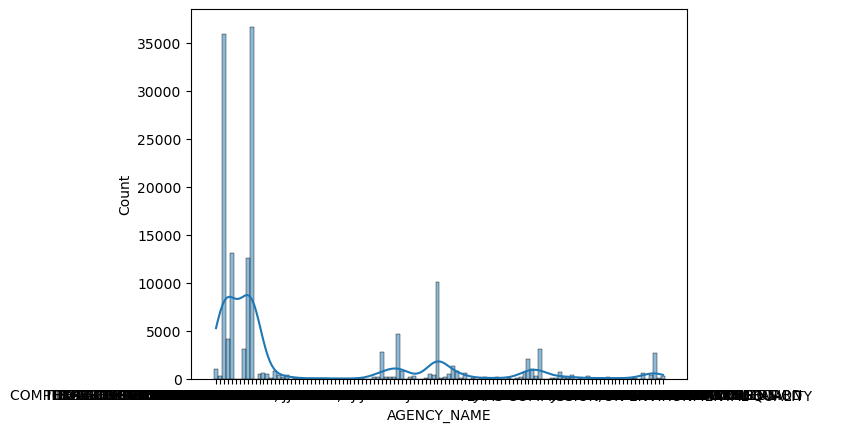

In [15]:
sns.histplot(x=df2['AGENCY_NAME'], data=df2, kde=True)
plt.show()

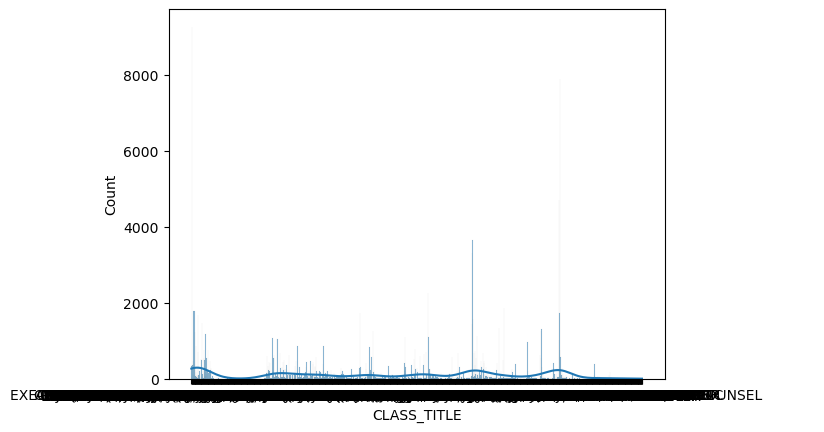

In [16]:
sns.histplot(x=df2['CLASS_TITLE'], data=df2, kde=True)
plt.show()

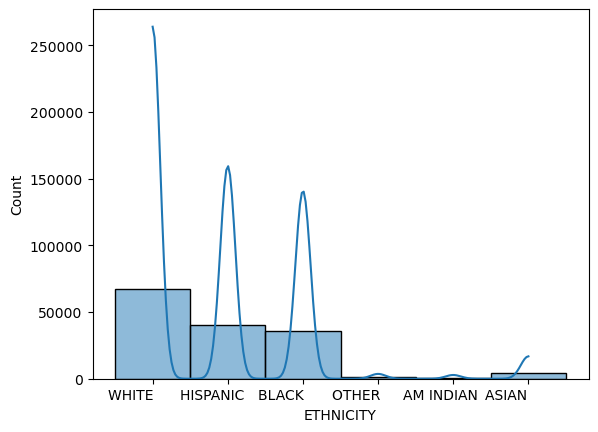

In [17]:
sns.histplot(x=df2['ETHNICITY'], data=df2, kde=True)
plt.show()

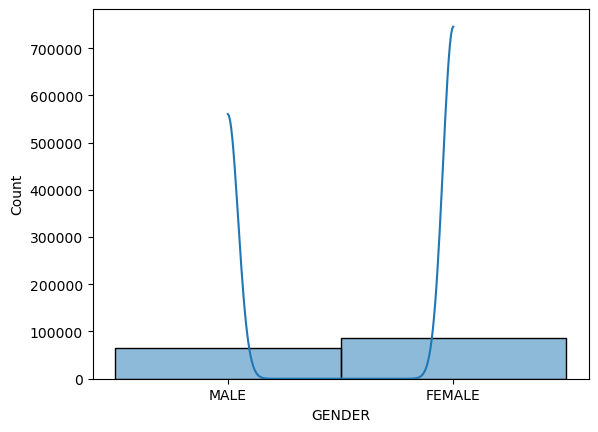

In [18]:
sns.histplot(x=df2['GENDER'], data=df2, kde=True)
plt.show()

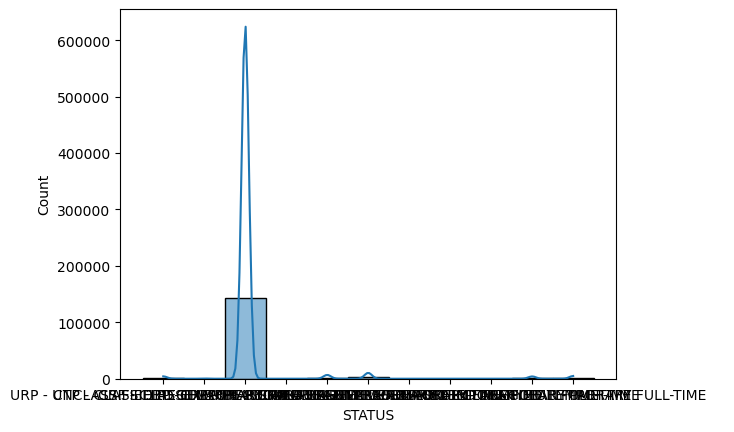

In [19]:
sns.histplot(x=df2['STATUS'], data=df2, kde=True)
plt.show()

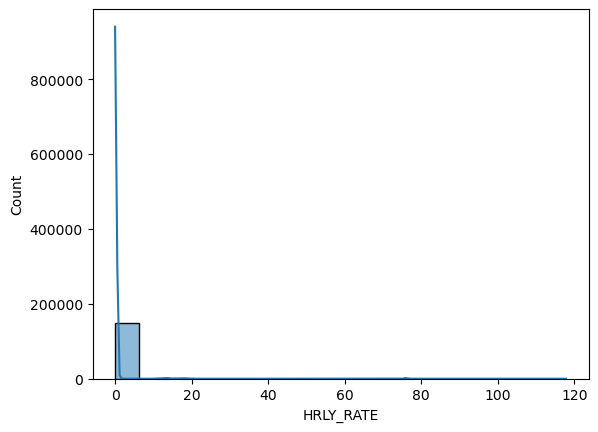

In [20]:
sns.histplot(x=df2['HRLY_RATE'], data=df2, kde=True)
plt.show()

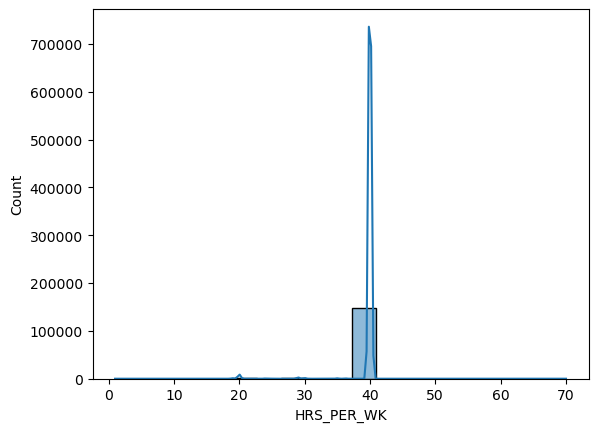

In [21]:
sns.histplot(x=df2['HRS_PER_WK'], data=df2, kde=True)
plt.show()

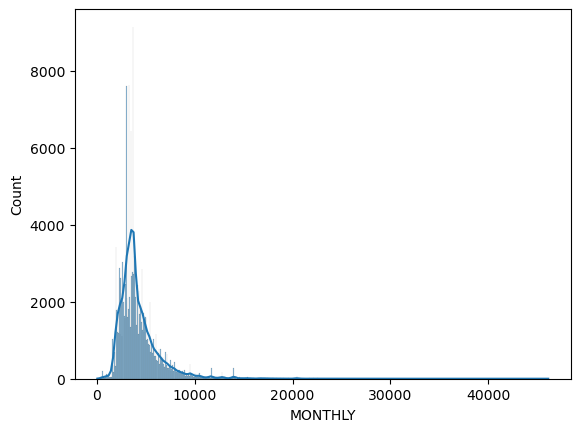

In [22]:
sns.histplot(x=df2['MONTHLY'], data=df2, kde=True)
plt.show()

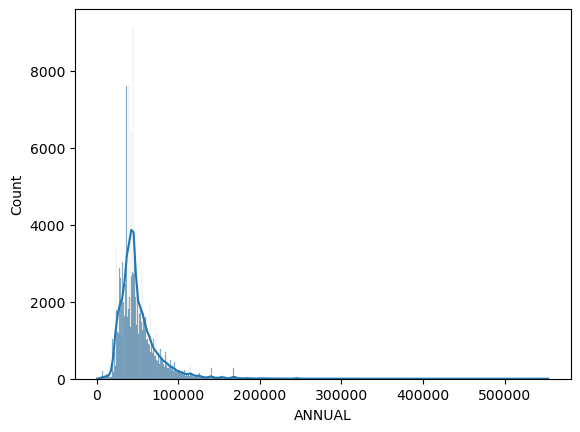

In [23]:
sns.histplot(x=df2['ANNUAL'], data=df2, kde=True)
plt.show()

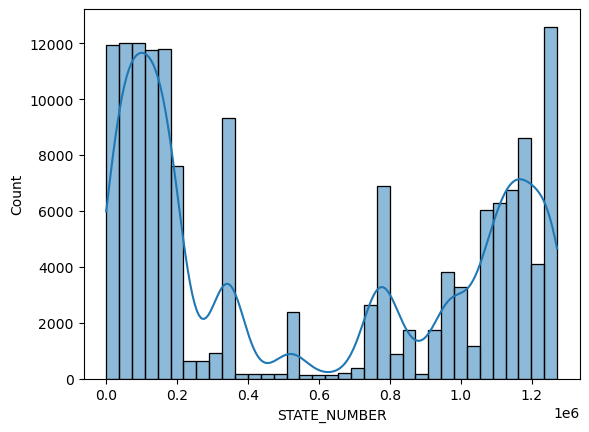

In [24]:
sns.histplot(x=df2['STATE_NUMBER'], data=df2, kde=True)
plt.show()

In [25]:
import sweetviz as sv
my_report = sv.analyze(df2)
my_report.show_html()

                                             |          | [  0%]   00:00 -> (? left)

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


### Insights from univariate analysis

24.5% employee work in 'HEALTH AND HUMAN SERVICES COMMISSION' and 24% employee work in 'TEXAS DEPARTMENT OF CRIMINAL JUSTICE'.

Out of all the empoyees 45% are 'WHITE', 27% are 'HISPANIC', 24% are 'BLACK'

In genderwise comparison 57% employees are 'female' and 43% employees are 'male'.

95% employees are 'CRF - CLASSIFIED REGULAR FULL-TIME'.

98.3% employees work for 40 hours per week.

Most of the employees earn less than 10k per month.

ANNUAL and MONTHLY are having left skewed distribution.

## Bivariate Analysis

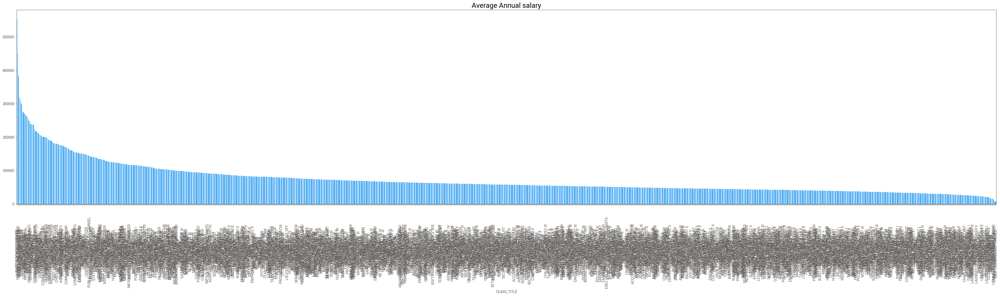

In [26]:
plt.figure(figsize=(50,10))
df2.groupby(['CLASS_TITLE'])['ANNUAL'].mean().sort_values(ascending = False).plot(kind='bar',fontsize=10)
plt.title('Average Annual salary', fontsize=20)
plt.show()

In [27]:
average_salary_by_title = df2.groupby(['CLASS_TITLE'])['ANNUAL'].mean()

# Identify the highest average salary
highest_salary_title = average_salary_by_title.idxmax()

print(f"The CLASS_TITLE with the highest average ANNUAL salary is: {highest_salary_title}")

The CLASS_TITLE with the highest average ANNUAL salary is: CHIEF SCIENTIFIC OFFICER                          


In [28]:
high_salary_employees = df2[df2['ANNUAL'] > 400000]
high_salary_employees.head()

,AGENCY,AGENCY_NAME,LAST_NAME,FIRST_NAME,MI,CLASS_CODE,CLASS_TITLE,ETHNICITY,GENDER,STATUS,EMPLOY_DATE,HRLY_RATE,HRS_PER_WK,MONTHLY,ANNUAL,STATE_NUMBER,duplicated,multiple_full_time_jobs,combined_multiple_jobs,summed_annual_salary,hide_from_search
14793,323,TEACHER RETIREMENT SYSTEM ...,AUBY,JASE,R,C204,CHIEF INVESTMENT OFFICER ...,WHITE,MALE,ERF - EXEMPT REGULAR FULL-TIME,11-09-2009,0.0,40.0,37500.0,450000.0,121522,NaN,NaN,NaN,NaN,NaN
83851,542,CANCER PREVENTION AND RESEARCH INSTITUTE OF TE...,WILLSON,JAMES,,C542,CHIEF SCIENTIFIC OFFICER ...,WHITE,MALE,ERF - EXEMPT REGULAR FULL-TIME,03-01-2016,0.0,40.0,46125.0,553500.0,372291,NaN,NaN,NaN,NaN,NaN
144232,327,EMPLOYEES RETIREMENT SYSTEM,TULL,CHARLES,T,D136,DIRECTOR OF INVESTMENTS ...,WHITE,MALE,URF - UNCLASSIFIED REGULAR FULL-TIME,02-01-2009,0.0,40.0,37500.0,450000.0,24680,NaN,NaN,NaN,NaN,NaN


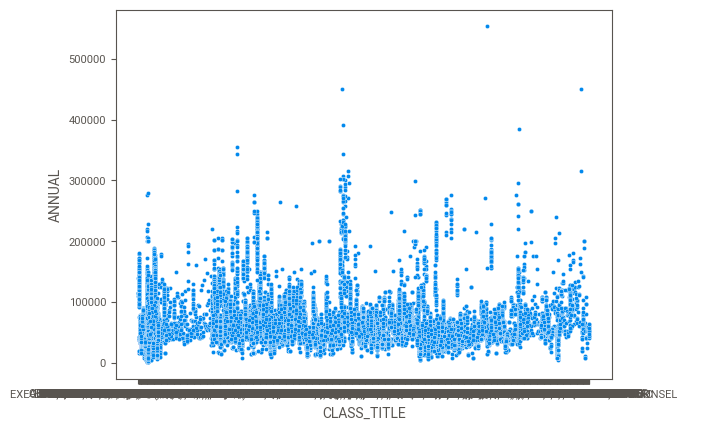

In [29]:
sns.scatterplot(x=df2.CLASS_TITLE,y=df2.ANNUAL,data=df2)
plt.show()

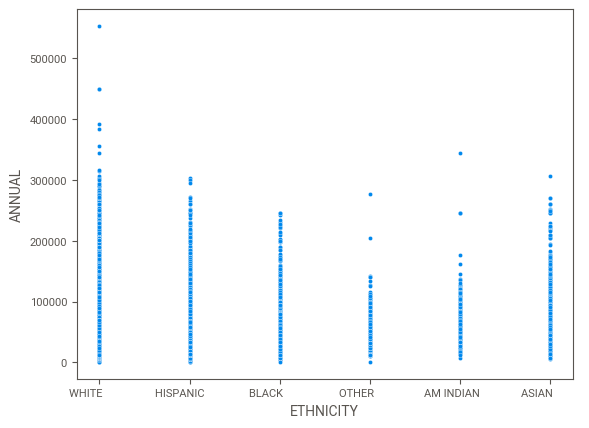

In [30]:
sns.scatterplot(x=df2.ETHNICITY,y=df2.ANNUAL,data=df2)
plt.show()

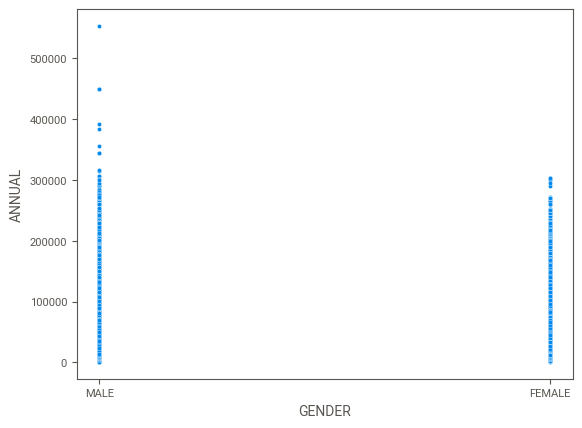

In [31]:
sns.scatterplot(x=df2.GENDER,y=df2.ANNUAL,data=df2)
plt.show()

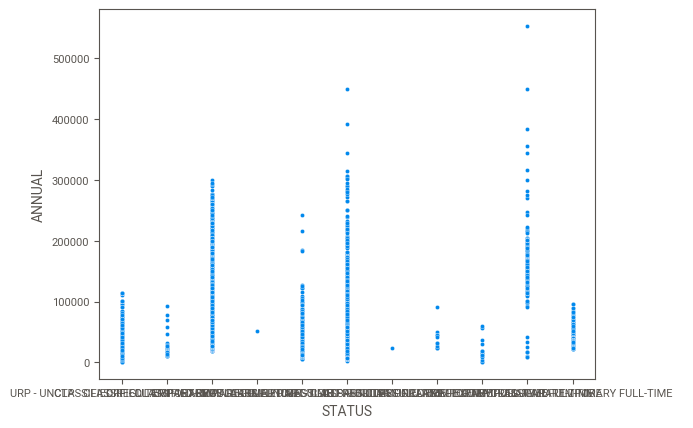

In [32]:
sns.scatterplot(x=df2.STATUS,y=df2.ANNUAL,data=df2)
plt.show()

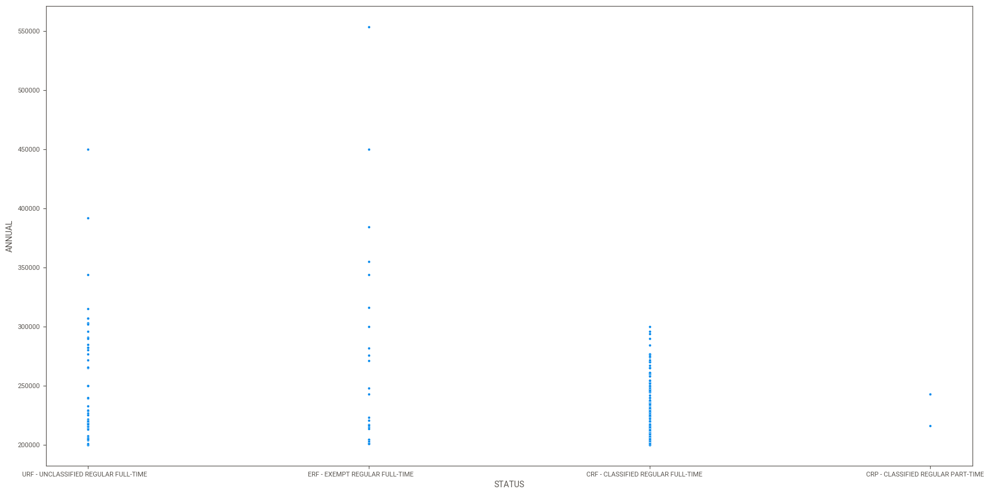

In [33]:
plt.figure(figsize=(20,10))
sns.scatterplot(x=df2.STATUS[df2.ANNUAL>200000],y=df2.ANNUAL,data=df2)
plt.show()

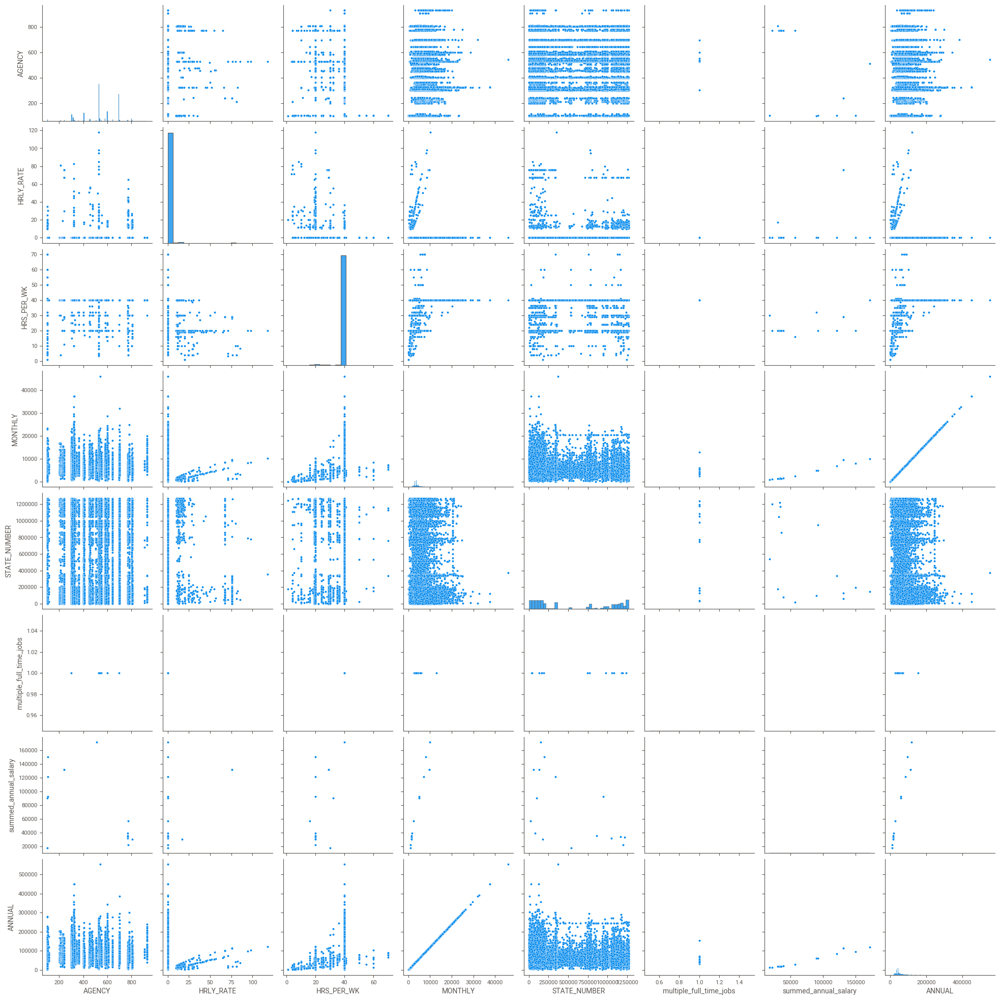

In [34]:
sns.pairplot(data=df2[['AGENCY','HRLY_RATE','HRS_PER_WK','MONTHLY','STATE_NUMBER','multiple_full_time_jobs','summed_annual_salary','ANNUAL']])
plt.show()

### Insights from Bivariate analysis

There is no trend between AGENCY and ANNUAL

ANNUAL and MONTHLY are the same features.

There is no trend in STATE_NUMBER and ANNUAL.

Only WHITE, MALE employees are getting salary above 300000.

 Employees working 30-40 HRS_PER_WEEK are getting higher salary.

According to CLASS_TITLE mejority of employees earn less than 300000.

Only 'UNCLASSIFIED REGULAR FULLTIME', 'EXEMPT REGULAR FULL-TIME', 'CLASSIFIED REGULAR FULL-TIME', 'CLASSIFIED REGULAR PRT-TIME' employees are getting ANNUAL salary greater than 300000.

## Multivariate Analysis

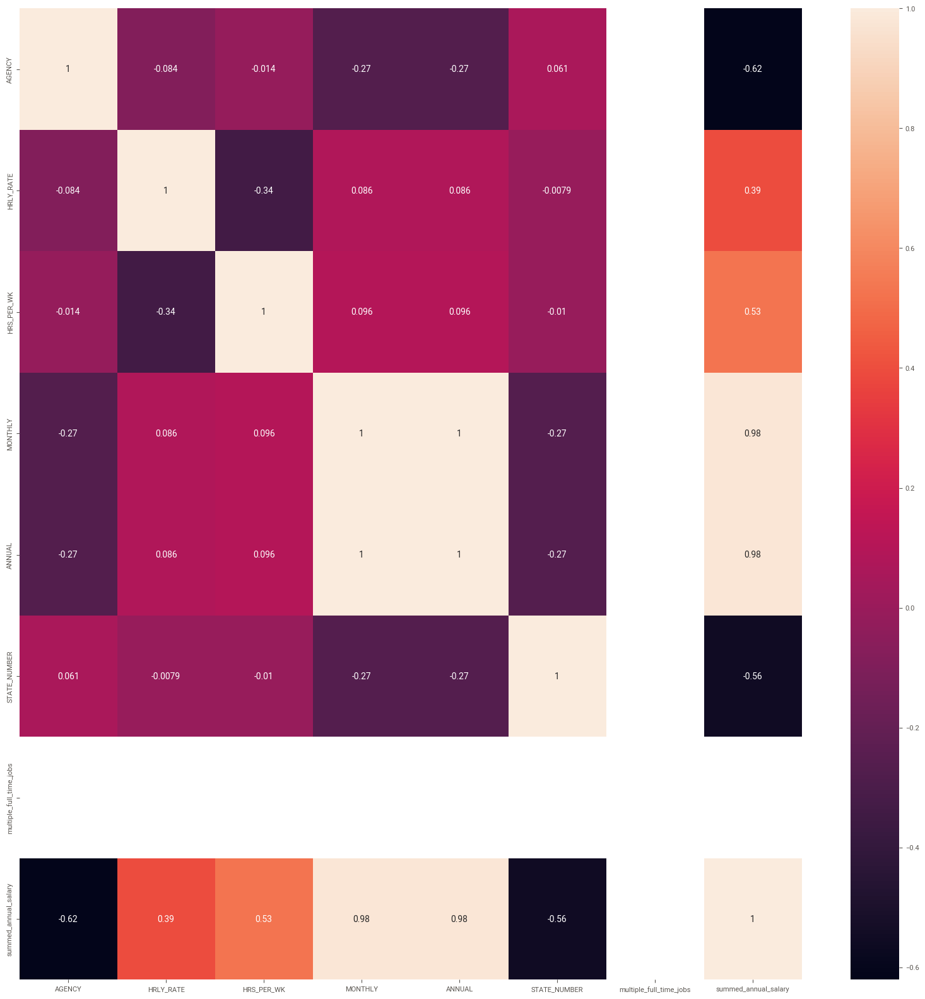

In [35]:
plt.figure(figsize=(20,20),facecolor='white')
sns.heatmap(data= df2.select_dtypes(exclude='object').corr(),annot=True)
plt.show()

### Insights of Multivariate analysis 

MONTHLY and ANNUAL both are highly corelated to each other.

summed_annual_salary is highly corelated to MONTHLY and ANNUAL.

## Data preprocessing

In [36]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149481 entries, 0 to 149480
Data columns (total 21 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   AGENCY                   149481 non-null  int64  
 1   AGENCY_NAME              149481 non-null  object 
 2   LAST_NAME                149481 non-null  object 
 3   FIRST_NAME               149481 non-null  object 
 4   MI                       149481 non-null  object 
 5   CLASS_CODE               149481 non-null  object 
 6   CLASS_TITLE              149481 non-null  object 
 7   ETHNICITY                149481 non-null  object 
 8   GENDER                   149481 non-null  object 
 9   STATUS                   149481 non-null  object 
 10  EMPLOY_DATE              149481 non-null  object 
 11  HRLY_RATE                149481 non-null  float64
 12  HRS_PER_WK               149481 non-null  float64
 13  MONTHLY                  149481 non-null  float64
 14  ANNU

In [37]:
df2.isnull().sum()

AGENCY                          0
AGENCY_NAME                     0
LAST_NAME                       0
FIRST_NAME                      0
MI                              0
CLASS_CODE                      0
CLASS_TITLE                     0
ETHNICITY                       0
GENDER                          0
STATUS                          0
EMPLOY_DATE                     0
HRLY_RATE                       0
HRS_PER_WK                      0
MONTHLY                         0
ANNUAL                          0
STATE_NUMBER                    0
duplicated                 149338
multiple_full_time_jobs    149467
combined_multiple_jobs     149384
summed_annual_salary       149465
hide_from_search           149465
dtype: int64

Data column 'duplicated', 'multiple_full_time_jobs', 'combined_multiple_jobs', 'summed_annual_salary', 'hide_from_search' are having 99% null values, so it is good to drop them.

For AGENCY_NAME there is particular Number in AGENCY so AGENCY column dropped.

MONTHLY and ANNUAL column are same so MONTHLY column dropped.

As LAST_NAME, FIRST_NAME and MI columns have no relation with target, there are dropped.

In [38]:
data = df2.drop(['AGENCY','LAST_NAME','FIRST_NAME','MI','CLASS_CODE','duplicated','MONTHLY','multiple_full_time_jobs','combined_multiple_jobs','summed_annual_salary','hide_from_search'],axis=1)
data.head(2)

,AGENCY_NAME,CLASS_TITLE,ETHNICITY,GENDER,STATUS,EMPLOY_DATE,HRLY_RATE,HRS_PER_WK,ANNUAL,STATE_NUMBER
0,"COMPTROLLER OF PUBLIC ACCOUNTS, JUDICIARY SECT...","JUDGE, RETIRED ...",WHITE,MALE,URP - UNCLASSIFIED REGULAR PART-TIME,02/18/88,75.96150,29.0,114549.84,127717
1,OFFICE OF COURT ADMINISTRATION ...,GENERAL COUNSEL IV ...,WHITE,MALE,CTP - CLASSIFIED TEMPORARY PART-TIME,02-01-2015,81.04454,4.0,16857.24,127717


In [39]:
data.shape

(149481, 10)

### Calculating years of experience using EMPLOY_DATE column

In [40]:
data.head(2)

,AGENCY_NAME,CLASS_TITLE,ETHNICITY,GENDER,STATUS,EMPLOY_DATE,HRLY_RATE,HRS_PER_WK,ANNUAL,STATE_NUMBER
0,"COMPTROLLER OF PUBLIC ACCOUNTS, JUDICIARY SECT...","JUDGE, RETIRED ...",WHITE,MALE,URP - UNCLASSIFIED REGULAR PART-TIME,02/18/88,75.96150,29.0,114549.84,127717
1,OFFICE OF COURT ADMINISTRATION ...,GENERAL COUNSEL IV ...,WHITE,MALE,CTP - CLASSIFIED TEMPORARY PART-TIME,02-01-2015,81.04454,4.0,16857.24,127717


In [41]:
# Changing data type of EMPLOY_DATE column to datetime
from datetime import datetime as dt
data['EMPLOY_DATE'] = pd.to_datetime(data['EMPLOY_DATE'])
data['year'] = data['EMPLOY_DATE'].dt.year

In [42]:
import datetime as dt
data['current_year'] = dt.datetime.combine(dt.date.today(),dt.datetime.min.time())

In [43]:
data['experience'] = ((data.current_year)-(data.EMPLOY_DATE)).apply(lambda x: str(x).split(' ')[0]).apply(lambda x: int(x)/365)

In [44]:
data.head(2)

,AGENCY_NAME,CLASS_TITLE,ETHNICITY,GENDER,STATUS,EMPLOY_DATE,HRLY_RATE,HRS_PER_WK,ANNUAL,STATE_NUMBER,year,current_year,experience
0,"COMPTROLLER OF PUBLIC ACCOUNTS, JUDICIARY SECT...","JUDGE, RETIRED ...",WHITE,MALE,URP - UNCLASSIFIED REGULAR PART-TIME,1988-02-18,75.96150,29.0,114549.84,127717,1988,2025-02-25,37.046575
1,OFFICE OF COURT ADMINISTRATION ...,GENERAL COUNSEL IV ...,WHITE,MALE,CTP - CLASSIFIED TEMPORARY PART-TIME,2015-02-01,81.04454,4.0,16857.24,127717,2015,2025-02-25,10.073973


In [45]:
data.experience.max()

56.273972602739725

In [46]:
data.experience.min()

-44.41095890410959

In [47]:
f = data.loc[data['experience']<0]
f

,AGENCY_NAME,CLASS_TITLE,ETHNICITY,GENDER,STATUS,EMPLOY_DATE,HRLY_RATE,HRS_PER_WK,ANNUAL,STATE_NUMBER,year,current_year,experience
116978,TEXAS DEPARTMENT OF CRIMINAL JUSTICE ...,AGRICULTURE SPEC V ...,WHITE,MALE,CRF - CLASSIFIED REGULAR FULL-TIME,2069-07-14,0.0,40.0,48404.88,68427,2069,2025-02-25,-44.410959
141891,HOUSE OF REPRESENTATIVES,ELECTED OFFICIAL ...,WHITE,MALE,URF - UNCLASSIFIED REGULAR FULL-TIME,2069-01-14,0.0,40.0,7200.00,116511,2069,2025-02-25,-43.915068


In [48]:
data.drop(f.index, inplace=True)

In [49]:
data.drop(['EMPLOY_DATE','year','current_year'], inplace=True, axis=1)

In [50]:
data.head(2)

,AGENCY_NAME,CLASS_TITLE,ETHNICITY,GENDER,STATUS,HRLY_RATE,HRS_PER_WK,ANNUAL,STATE_NUMBER,experience
0,"COMPTROLLER OF PUBLIC ACCOUNTS, JUDICIARY SECT...","JUDGE, RETIRED ...",WHITE,MALE,URP - UNCLASSIFIED REGULAR PART-TIME,75.96150,29.0,114549.84,127717,37.046575
1,OFFICE OF COURT ADMINISTRATION ...,GENERAL COUNSEL IV ...,WHITE,MALE,CTP - CLASSIFIED TEMPORARY PART-TIME,81.04454,4.0,16857.24,127717,10.073973


### One hot encoding

In [51]:
data = pd.get_dummies(data, drop_first=True)
data

HRLY_RATE  HRS_PER_WK     ANNUAL  STATE_NUMBER  experience  \
0        75.96150        29.0  114549.84        127717   37.046575   
1        81.04454         4.0   16857.24        127717   10.073973   
2        75.96150        29.0  114549.84         59115    5.071233   
3        81.04453         4.0   16857.24         59115    6.490411   
4         0.00000        40.0   39411.24        165030    4.663014   
...           ...         ...        ...           ...         ...   
149476    0.00000        40.0   34788.00        770781    7.328767   
149477    0.00000        40.0   66000.00        847431    9.630137   
149478   12.93000        20.0   13447.20         34266   12.372603   
149479    0.00000        40.0   68929.92        123490   35.452055   
149480   11.74000        20.0   12209.52        103583   13.035616   

        AGENCY_NAME_BOARD OF ARCHITECTURAL EXAMINERS                    \
0                                                       0                
1                                                       0                
2                                                       0                
3                                                       0                
4                                                       0                
...                                                   ...                
149476                                                  0                
149477                                                  0                
149478                                                  0                
149479                                                  0                
149480                                                  0                

        AGENCY_NAME_BOARD OF CHIROPRACTIC EXAMINERS                     \
0                                                       0                
1                                                       0                
2                                                       0                
3                                                       0                
4                                                       0                
...                                                   ...                
149476                                                  0                
149477                                                  0                
149478                                                  0                
149479                                                  0                
149480                                                  0                

        AGENCY_NAME_BOARD OF DENTAL EXAMINERS                           \
0                                                       0                
1                                                       0                
2                                                       0                
3                                                       0                
4                                                       0                
...                                                   ...                
149476                                                  0                
149477                                                  0                
149478                                                  0                
149479                                                  0                
149480                                                  0                

        AGENCY_NAME_BOARD OF EXAMINERS OF PSYCHOLOGISTS                 \
0                                                       0                
1                                                       0                
2                                                       0                
3                                                       0                
4                                                       0                
...                                                   ..

## Model Creation

### Linear regression

In [52]:
X = data.drop(['ANNUAL'], axis=1)
y = data.ANNUAL

In [53]:
X

HRLY_RATE  HRS_PER_WK  STATE_NUMBER  experience  \
0        75.96150        29.0        127717   37.046575   
1        81.04454         4.0        127717   10.073973   
2        75.96150        29.0         59115    5.071233   
3        81.04453         4.0         59115    6.490411   
4         0.00000        40.0        165030    4.663014   
...           ...         ...           ...         ...   
149476    0.00000        40.0        770781    7.328767   
149477    0.00000        40.0        847431    9.630137   
149478   12.93000        20.0         34266   12.372603   
149479    0.00000        40.0        123490   35.452055   
149480   11.74000        20.0        103583   13.035616   

        AGENCY_NAME_BOARD OF ARCHITECTURAL EXAMINERS                    \
0                                                       0                
1                                                       0                
2                                                       0                
3                                                       0                
4                                                       0                
...                                                   ...                
149476                                                  0                
149477                                                  0                
149478                                                  0                
149479                                                  0                
149480                                                  0                

        AGENCY_NAME_BOARD OF CHIROPRACTIC EXAMINERS                     \
0                                                       0                
1                                                       0                
2                                                       0                
3                                                       0                
4                                                       0                
...                                                   ...                
149476                                                  0                
149477                                                  0                
149478                                                  0                
149479                                                  0                
149480                                                  0                

        AGENCY_NAME_BOARD OF DENTAL EXAMINERS                           \
0                                                       0                
1                                                       0                
2                                                       0                
3                                                       0                
4                                                       0                
...                                                   ...                
149476                                                  0                
149477                                                  0                
149478                                                  0                
149479                                                  0                
149480                                                  0                

        AGENCY_NAME_BOARD OF EXAMINERS OF PSYCHOLOGISTS                 \
0                                                       0                
1                                                       0                
2                                                       0                
3                                                       0                
4                                                       0                
...                                                   ...                
149476                                                  0                
149477                                  

In [54]:
y

0         114549.84
1          16857.24
2         114549.84
3          16857.24
4          39411.24
            ...    
149476     34788.00
149477     66000.00
149478     13447.20
149479     68929.92
149480     12209.52
Name: ANNUAL, Length: 149479, dtype: float64

#### Linear regresion model with test size 25% and random state = 42

In [55]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.25,random_state=42)

In [56]:
from sklearn.linear_model import LinearRegression
LR = LinearRegression()
LR.fit(X_train, y_train)

LinearRegression()

In [57]:
y_predict = LR.predict(X_test)

In [58]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

R2_score = r2_score(y_test, y_predict)
R2_score

0.9043166452618083

In [59]:
X_test.shape

(37370, 1554)

In [60]:
adjusted_r2_score = 1-(1-0.9043)*(37370-1)/(37370-1554-1)
adjusted_r2_score

0.9001476113360324

In [61]:
MAE = mean_absolute_error(y_test, y_predict)
MAE

3386.1696543629578

#### Linear model 2 with test size = 30% and random state = 10

In [62]:
# Trying with different split ratio
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.3,random_state=10)
LR = LinearRegression()
LR.fit(X_train, y_train)
y_predict = LR.predict(X_test)
R2_score = r2_score(y_test, y_predict)
R2_score

0.9389915947680803

In [63]:
X_test.shape

(44844, 1554)

In [64]:
adjusted_r2_score = 1-(1-0.938)*(44844-1)/(44844-1554-1)
adjusted_r2_score

0.9357743075608121

#### Linear model 3 with test size = 30% and random state = 3

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.3,random_state=3)
LR = LinearRegression()
LR.fit(X_train, y_train)
y_predict = LR.predict(X_test)
R2_score = r2_score(y_test, y_predict)
R2_score

0.9144943135945429

In [66]:
X_test.shape

(44844, 1554)

In [67]:
adjusted_r2_score = 1-(1-0.914)*(44844-1)/(44844-1554-1)
adjusted_r2_score

0.9109127491972557

#### Linear model 4 with test size = 25% and random state = 10

In [68]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.25,random_state=10)
LR = LinearRegression()
LR.fit(X_train, y_train)
y_predict = LR.predict(X_test)
R2_score = r2_score(y_test, y_predict)
R2_score

0.940382217891907

In [69]:
X_test.shape

(37370, 1554)

In [70]:
adjusted_r2_score = 1-(1-0.9403)*(37370-1)/(37370-1554-1)
adjusted_r2_score

0.9377096384196566

### Decision Tree Regressor

In [71]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.25,random_state=10)

from sklearn.tree import DecisionTreeRegressor
model = DecisionTreeRegressor(random_state=44)
model.fit(X_train, y_train)
y_predict = model.predict(X_test)

In [72]:
R2_score = r2_score(y_test, y_predict)
R2_score

0.837641126511643

In [73]:
X_test.shape

(37370, 1554)

In [74]:
adjusted_r2_score = 1-(1-0.8376)*(37370-1)/(37370-1554-1)
adjusted_r2_score

0.8305535222672065

### Random Forest Regressor

In [75]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.25,random_state=10)

from sklearn.ensemble import RandomForestRegressor
regressor = RandomForestRegressor(n_estimators = 10, random_state= 42)
regressor.fit(X_train, y_train)

RandomForestRegressor(n_estimators=10, random_state=42)

In [76]:
y_predict = regressor.predict(X_test)

In [77]:
R2_score = r2_score(y_test, y_predict)
R2_score

0.882527946576463

In [78]:
X_test.shape

(37370, 1554)

In [79]:
adjusted_r2_score = 1-(1-0.8825)*(37370-1)/(37370-1554-1)
adjusted_r2_score

0.8774017171576155

In [80]:
# random forest 2
regressor = RandomForestRegressor(n_estimators = 50, random_state= 42)
regressor.fit(X_train, y_train)
y_predict = regressor.predict(X_test)
R2_score = r2_score(y_test, y_predict)
R2_score

0.8866875094069814

In [81]:
adjusted_r2_score = 1-(1-0.886)*(37370-1)/(37370-1554-1)
adjusted_r2_score

0.8810535809018568

### KNN Regressor

In [82]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.25,random_state=42)

In [83]:
from sklearn.neighbors import KNeighborsRegressor
import math

error = []

for k in range(0, 20):
    k = k+1
    KNN_model = KNeighborsRegressor(n_neighbors = k)
    KNN_model.fit(X_train, y_train)
    y_predict = KNN_model.predict(X_test)
    err = math.sqrt(mean_squared_error(y_test, y_predict))
    error.append(err)
    print("For k = ",k," RMSE value = ", err)


For k =  1  RMSE value =  31847.618096198144
For k =  2  RMSE value =  28042.550925406726
For k =  3  RMSE value =  26507.470759379914
For k =  4  RMSE value =  25751.5813319983
For k =  5  RMSE value =  25339.438500281267
For k =  6  RMSE value =  25009.714596907706
For k =  7  RMSE value =  24830.333063827205
For k =  8  RMSE value =  24686.439809121293
For k =  9  RMSE value =  24569.535799887515
For k =  10  RMSE value =  24484.847866619144
For k =  11  RMSE value =  24400.0761941958
For k =  12  RMSE value =  24362.78383493578
For k =  13  RMSE value =  24329.708692155982
For k =  14  RMSE value =  24286.864732931354
For k =  15  RMSE value =  24254.824023276138
For k =  16  RMSE value =  24204.155890602597
For k =  17  RMSE value =  24167.889499474088
For k =  18  RMSE value =  24138.31327985344
For k =  19  RMSE value =  24107.78265704166
For k =  20  RMSE value =  24080.701992210354


Text(0, 0.5, 'Error')

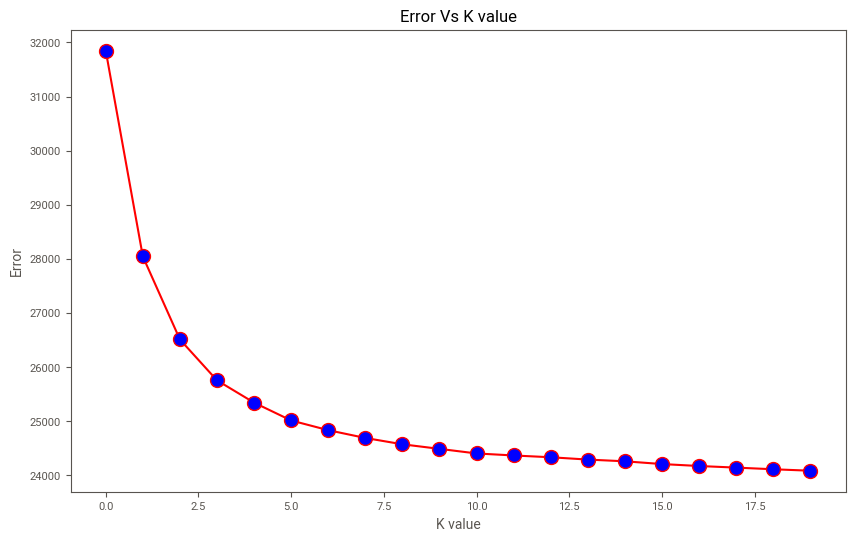

In [84]:
plt.figure(figsize=(10,6))
plt.plot(range(0,20),error, color='red',marker='o',markerfacecolor='blue', markersize=10)
plt.title('Error Vs K value')
plt.xlabel('K value')
plt.ylabel('Error')

In [85]:
KNN = KNeighborsRegressor(n_neighbors = 8)
KNN.fit(X_train, y_train)
y_pred = KNN.predict(X_test)

In [86]:
R2_score = r2_score(y_test, y_pred)
R2_score

0.03973060553925645

In [87]:
X_test.shape

(37370, 1554)

In [88]:
adjusted_r2 = 1-(1-0.0393)*(37370- 1)/(37370-1554-1)
adjusted_r2

-0.002384428312159681

## Task 3

#### Who are the outliers in the salaries?

<Axes: xlabel='ANNUAL'>

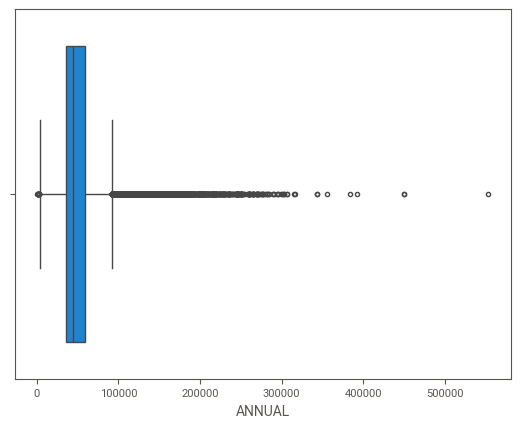

In [89]:
sns.boxplot(x = 'ANNUAL', data=df2)

In [90]:
from scipy import stats
IQR = stats.iqr(df2.ANNUAL, interpolation = 'midpoint')
IQR

22151.64

In [91]:
Q1 = df2.ANNUAL.quantile(0.25)
Q3 = df2.ANNUAL.quantile(0.75)
print("Q1: ", Q1)
print("Q3: ", Q3)

Q1:  36238.08
Q3:  58389.72


In [92]:
lower_limit = Q1 - 1.5*IQR
upper_limit = Q3 + 1.5*IQR
print("Lower Limit:", lower_limit)
print("Upper Limit:", upper_limit)
df = pd.concat([df2.loc[df2.ANNUAL<lower_limit],df2.loc[df2.ANNUAL>upper_limit]])

Lower Limit: 3010.6200000000026
Upper Limit: 91617.18


In [93]:
df

,AGENCY,AGENCY_NAME,LAST_NAME,FIRST_NAME,MI,CLASS_CODE,CLASS_TITLE,ETHNICITY,GENDER,STATUS,EMPLOY_DATE,HRLY_RATE,HRS_PER_WK,MONTHLY,ANNUAL,STATE_NUMBER,duplicated,multiple_full_time_jobs,combined_multiple_jobs,summed_annual_salary,hide_from_search
141394,101,SENATE,EDMONDSON,DOUGLAS,,7103,LEG. SERVICE/MAINTENANCE ...,WHITE,MALE,UTP - UNCLASSIFIED TEMPORARY PART-TIME,02-03-2005,20.0,1.0,86.66,1039.92,176291,NaN,NaN,NaN,NaN,NaN
141415,101,SENATE,FONTENOT,RACHEAL,D,7103,LEG. SERVICE/MAINTENANCE ...,OTHER,FEMALE,UTP - UNCLASSIFIED TEMPORARY PART-TIME,12-04-2019,20.0,1.0,86.66,1039.92,1246122,NaN,NaN,NaN,NaN,NaN
141808,102,HOUSE OF REPRESENTATIVES,BERNAL,JESUS,R,7110,ELECTED OFFICIALS STAFF ...,HISPANIC,MALE,URP - UNCLASSIFIED REGULAR PART-TIME,04-12-2017,0.0,10.0,100.00,1200.00,118315,NaN,NaN,NaN,NaN,NaN
141809,102,HOUSE OF REPRESENTATIVES,BHALLA,RACHEL,C,7110,ELECTED OFFICIALS STAFF ...,WHITE,FEMALE,URP - UNCLASSIFIED REGULAR PART-TIME,01-08-2019,0.0,10.0,200.00,2400.00,1164537,NaN,NaN,NaN,NaN,NaN
141897,102,HOUSE OF REPRESENTATIVES,CRUZ JR,PHILLIP,,7110,ELECTED OFFICIALS STAFF ...,HISPANIC,MALE,URP - UNCLASSIFIED REGULAR PART-TIME,12-01-2017,0.0,20.0,100.00,1200.00,338420,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149374,809,STATE PRESERVATION BOARD,KOCH,MARGARET,M,1623,DIRECTOR IV ...,WHITE,FEMALE,CRF - CLASSIFIED REGULAR FULL-TIME,01/23/13,0.0,40.0,10583.34,127000.08,336971,NaN,NaN,NaN,NaN,NaN
149393,809,STATE PRESERVATION BOARD,MEDINA,JOE,,1603,MGR IV ...,HISPANIC,MALE,CRF - CLASSIFIED REGULAR FULL-TIME,03/15/04,0.0,40.0,8358.41,100300.92,9905,NaN,NaN,NaN,NaN,NaN
149401,809,STATE PRESERVATION BOARD,NUNN,CHRISTOPHER,L,1602,MGR III ...,BLACK,MALE,CRF - CLASSIFIED REGULAR FULL-TIME,10-12-2005,0.0,40.0,7916.67,95000.04,38235,NaN,NaN,NaN,NaN,NaN
149415,809,STATE PRESERVATION BOARD,PROVINE,CYNTHIA,R,1622,DIRECTOR III ...,WHITE,FEMALE,CRF - CLASSIFIED REGULAR FULL-TIME,12-02-2008,0.0,40.0,10188.09,122257.08,52817,NaN,NaN,NaN,NaN,NaN


### 	What departments/roles have the biggest wage disparities between managers and employees?

In [94]:
df2.ANNUAL.max()

553500.0

In [95]:
# Employee with Maximum ANNUAL salary
df2.loc[df2['ANNUAL']==df2['ANNUAL'].max()]

,AGENCY,AGENCY_NAME,LAST_NAME,FIRST_NAME,MI,CLASS_CODE,CLASS_TITLE,ETHNICITY,GENDER,STATUS,EMPLOY_DATE,HRLY_RATE,HRS_PER_WK,MONTHLY,ANNUAL,STATE_NUMBER,duplicated,multiple_full_time_jobs,combined_multiple_jobs,summed_annual_salary,hide_from_search
83851,542,CANCER PREVENTION AND RESEARCH INSTITUTE OF TE...,WILLSON,JAMES,,C542,CHIEF SCIENTIFIC OFFICER ...,WHITE,MALE,ERF - EXEMPT REGULAR FULL-TIME,03-01-2016,0.0,40.0,46125.0,553500.0,372291,NaN,NaN,NaN,NaN,NaN


In [96]:
df2.ANNUAL.min()

600.0

In [97]:
# Employee with minimum annual salary
df2.loc[df2['ANNUAL']==df2['ANNUAL'].min()]

,AGENCY,AGENCY_NAME,LAST_NAME,FIRST_NAME,MI,CLASS_CODE,CLASS_TITLE,ETHNICITY,GENDER,STATUS,EMPLOY_DATE,HRLY_RATE,HRS_PER_WK,MONTHLY,ANNUAL,STATE_NUMBER,duplicated,multiple_full_time_jobs,combined_multiple_jobs,summed_annual_salary,hide_from_search
142067,102,HOUSE OF REPRESENTATIVES,HOUSTON,DONTE,D,7110,ELECTED OFFICIALS STAFF ...,BLACK,MALE,URP - UNCLASSIFIED REGULAR PART-TIME,05-01-2020,0.0,10.0,50.0,600.0,851628,NaN,NaN,NaN,NaN,NaN


In [98]:
# Creating dataframe with AGENCY wise min, max salary and their difference
salary_summary = df2.groupby('AGENCY')['ANNUAL'].agg(['min', 'max'])

# Rename the columns
salary_summary.rename(columns={'min': 'Min Salary', 'max': 'Max Salary'}, inplace=True)
# Calculate difference in salary
salary_summary['difference'] = salary_summary['Max Salary'] - salary_summary['Min Salary']
print(salary_summary)

        Min Salary  Max Salary  difference
AGENCY                                    
101        1039.92   276500.04   275460.12
102         600.00   279996.00   279396.00
103       16182.48   179826.00   163643.52
104       45000.00   219999.96   174999.96
105       10399.92   131968.68   121568.76
...            ...         ...         ...
808       14400.00   156651.96   142251.96
809        9360.00   175989.96   166629.96
813       39999.96   129927.00    89927.04
907       61773.24   109004.04    47230.80
930       38400.00   240000.00   201600.00

[113 rows x 3 columns]


In [99]:
salary_summary['difference'].idxmax()

542

In [100]:
salary_summary.sort_values(by ='difference',ascending=False,inplace =True)

In [101]:
salary_summary.head()

,Min Salary,Max Salary,difference
AGENCY,,,
542,60000.00,553500.00,493500.00
323,13338.00,450000.00,436662.00
327,31200.00,450000.00,418800.00
701,31742.76,384375.00,352632.24
601,9828.00,343999.92,334171.92


In [102]:
salary_summary.loc[salary_summary.index[0],'difference']

493500.0

In [103]:
df2.index[salary_summary.index[0]]

542

In [104]:
df2.loc[df2.AGENCY == salary_summary.index[0],'AGENCY_NAME'].iloc[0]

'CANCER PREVENTION AND RESEARCH INSTITUTE OF TEXAS '

In [105]:
print("Top 5 departments with big salary differences")
for i in range(0,5):
    print("AGENCY:",df2.loc[df2.AGENCY == salary_summary.index[i],'AGENCY'].iloc[0])
    print(df2.loc[df2.AGENCY == salary_summary.index[i],'AGENCY_NAME'].iloc[0])
    print("Difference:",salary_summary.loc[salary_summary.index[i],'difference'])
    print("-------")

Top 5 departments with big salary differences
AGENCY: 542
CANCER PREVENTION AND RESEARCH INSTITUTE OF TEXAS 
Difference: 493500.0
-------
AGENCY: 323
TEACHER RETIREMENT SYSTEM                         
Difference: 436662.0
-------
AGENCY: 327
EMPLOYEES RETIREMENT SYSTEM
Difference: 418800.0
-------
AGENCY: 701
TEXAS EDUCATION AGENCY                            
Difference: 352632.24
-------
AGENCY: 601
TEXAS DEPARTMENT OF TRANSPORTATION                
Difference: 334171.92
-------


## Have salaries and total compensations for some roles/ departments/ head-count changed over time?

In [106]:
data = df[['AGENCY_NAME','CLASS_TITLE','ANNUAL','EMPLOY_DATE']]

In [107]:
data.head(2)

,AGENCY_NAME,CLASS_TITLE,ANNUAL,EMPLOY_DATE
141394,SENATE,LEG. SERVICE/MAINTENANCE ...,1039.92,02-03-2005
141415,SENATE,LEG. SERVICE/MAINTENANCE ...,1039.92,12-04-2019


In [108]:
data1 = data.groupby(['AGENCY_NAME','CLASS_TITLE','EMPLOY_DATE'])
d = data1.first()
d

ANNUAL
AGENCY_NAME                                        CLASS_TITLE                                        EMPLOY_DATE           
ALCOHOLIC BEVERAGE COMMISSION                      ADMINISTRATOR, TEXAS A B C                         08-02-2017   199999.92
                                                   ATTORNEY IV                                        04/15/10      96600.00
                                                                                                      04/19/08      96600.00
                                                                                                      06/27/05      99000.00
                                                                                                      08-01-2019   105000.00
...                                                                                                                      ...
WATER DEVELOPMENT BOARD                            MGR V                                              04/16/18      91992.00
                                                                                                      11/14/16     114410.52
                                                                                                      11/20/00      91839.36
                                                   PROGRAM SPECIALIST VII                             05/21/08      92425.56
                                                   SYSTEMS ANALYST VI                                 01/20/88      96603.48

[7467 rows x 1 columns]

In [109]:
pd.set_option("display.max_rows",None)

In [110]:
d

ANNUAL
AGENCY_NAME                                        CLASS_TITLE                                        EMPLOY_DATE           
ALCOHOLIC BEVERAGE COMMISSION                      ADMINISTRATOR, TEXAS A B C                         08-02-2017   199999.92
                                                   ATTORNEY IV                                        04/15/10      96600.00
                                                                                                      04/19/08      96600.00
                                                                                                      06/27/05      99000.00
                                                                                                      08-01-2019   105000.00
                                                                                                      09/16/19     108000.00
                                                   ATTORNEY V                                         03/16/09     101000.04
                                                   CAPT, TABC                                         02-04-2013    98902.92
                                                   DEPUTY DIRECTOR I                                  09/15/17     183999.96
                                                   DIRECTOR I                                         01-02-2019    96165.00
                                                                                                      02-01-2019    99996.00
                                                                                                      02-02-2004    93819.96
                                                                                                      02/26/18     105000.00
                                                                                                      09-01-2017   110000.04
                                                                                                      10/16/17     114999.96
                                                                                                      11-01-2014   105000.00
                                                   DIRECTOR II                                        06/23/05     120000.00
                                                                                                      10-01-2005   129000.00
                                                                                                      12-01-2003   120000.00
                                                   DIRECTOR III                                       01/17/18     126148.08
                                                                                                      03-01-1999   127385.28
                                                                                                      03-04-2001   137000.04
                                                                                                      03/15/12     114646.80
                                                                                                      09/16/19     120000.00
                                                   DIRECTOR IV                                        05/14/18     144987.96
                                                                                                      08-01-2005   149000.04
                                                                                                      08/21/19     145500.00
                                                                                                      09-01-2019   125000.04
                                                   DIRECTOR VI                                        09-01-1993   175001.04
                                                                                                      09-11-2017   174999.96
                                                   GENERAL COUNSEL II                                 04/15/10     110

Salaries of some roles(CLASS_TITLE) with respect to AGENCY_NAME are changed over a period of time 

Salaries of some roles haven't changed with time(For example - 1) ALCOHOLIC BEVERAGE COMMISSION - MAJOR, TABC 2) BOARD OF PHARMACY- PHARMACIST I and PHARMACIST II).

## Model comparison Report

LINEAR REGRESSION          
Model 1  - Test_size= 25%, random_state=42               
r2_score = 0.9043  
adjusted_r2 = 0.9001

Model 2  - Test_size= 30%, random_state=10            
r2_score = 0.9389  
adjusted_r2 = 0.9357

Model 3  - Test_size= 30%, random_state=3                  
r2_score = 0.9144  
adjusted_r2 = 0.9109

Model 4  - Test_size= 25%, random_state=10           
r2_score = 0.9403  
adjusted_r2 = 0.9377


DECISION TREE REGRESSOR             
Model 1 - Test_size= 25%, random_state=10              
r2_score = 0.8376           
adjusted_r2 = 0.8305

RANDOM FOREST REGRESSOR                   
Model 1 - n_estimator= 10, random_state=42             
r2_score = 0.8825           
adjusted_r2 = 0.8774

Model 2 - n_estimator= 50, random_state=42           
r2_score = 0.8866             
adjusted_r2 = 0.8810

KNN REGRESSOR              
n_neighbors = 8            
r2_score = 0.0397          
adjusted_r2 = -0.0023

From above result we can easily conclude that Linear regresion Model 4 is good for production